In [1]:
import os, shutil

src = "/kaggle/input/stdc-repo/STDC-Seg"
dst = "/kaggle/working/STDC-Seg"

# ensure the parent exists
os.makedirs(os.path.dirname(dst), exist_ok=True)

# copy the whole tree
shutil.copytree(src, dst)

'/kaggle/working/STDC-Seg'

In [2]:
!pip install -q albumentations==1.4.18

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.0/224.0 kB 3.0 MB/s eta 0:00:00eta 0:00:01


In [3]:
import os
import sys
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
sys.path.append('/kaggle/working/STDC-Seg')

import albumentations as A
from models.model_stages import BiSeNet
from transform import Compose, ColorJitter, HorizontalFlip, RandomScale, RandomCrop
import torch.nn as nn
import torch
import torchvision.transforms as T
from PIL import Image
# Define the transform once (outside the training loop ideally)
color_jitter = A.Compose([
    A.ColorJitter(
        p=0.5
    ),
])

IMAGENET_MEAN = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
IMAGENET_STD  = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)


trans_train = Compose([
    ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5),
    HorizontalFlip(),
    RandomScale((0.125, 0.25, 0.375, 0.5, 0.675,
                            0.75, 0.875, 1.0, 1.25, 1.5)),
    RandomCrop((1024, 512)),
]) 

mask_transforms = T.Compose([
            T.PILToTensor(),  # Remove channel dimension
        ])
inv_mask_transforms = T.Compose([
    T.ToPILImage(),   # 1) tensor → PIL (mode “L” for a single‐channel mask)
])
# build the inverse Normalize
mean = (0.485, 0.456, 0.406)
std  = (0.229, 0.224, 0.225)
inv_mean = [-m/s for m, s in zip(mean, std)]
inv_std  = [1/s   for s in std]

# the inverse pipeline
inv_to_pil = T.Compose([
    # 1) un-normalize
    T.Normalize(mean=inv_mean, std=inv_std),
    # 2) back to PIL
    T.ToPILImage(),
])
to_tensor = T.Compose([
            T.ToTensor(),
            T.Normalize((0.485, 0.456, 0.406),
                        (0.229, 0.224, 0.225)),
        ])



import numpy as np
from PIL import Image
import torchvision.transforms as T

# we'll need this once  
_to_pil = T.ToPILImage()  

def apply_augmentation(img_tensor, lb_tensor):
    """
    img_tensor: FloatTensor[C,H,W] on CUDA, normalized
    lb_tensor:  LongTensor[H,W] on CUDA

    returns (img_aug, lb_aug) both on the same device
      img_aug: FloatTensor[C,H,W], re-normalized
      lb_aug:  LongTensor[H,W]
    """
    device = img_tensor.device

    # 1) Denormalize on GPU
    mean = IMAGENET_MEAN.to(device)    # [3,1,1]
    std  = IMAGENET_STD.to(device)     # [3,1,1]
    img_denorm = img_tensor * std + mean
    img_denorm = img_denorm.clamp(0,1)

    # 2) Convert CHW tensor → PIL (handles the channel ordering)
    img_pil = _to_pil(img_denorm.cpu())

    # 3) Convert mask to PIL
    # PILToTensor gave a 1×H×W tensor originally, so lb_tensor is H×W long
    lb_pil = Image.fromarray(lb_tensor.cpu().byte().numpy())

    # 4) Run augmentation
    data = {'im': img_pil, 'lb': lb_pil}
    augmented = trans_train(data)
    img_aug_pil = augmented['im']   # H×W×3 uint8
    lb_aug_pil  = augmented['lb']   # H×W uint8

    # 5) Back to numpy arrays
    img_aug_np = np.array(img_aug_pil)
    lb_aug_np  = np.array(lb_aug_pil)

    # 6) ToTensor & normalize image
    img_aug = to_tensor(img_aug_pil)              # FloatTensor[C,H,W]
    # 7) ToTensor for mask (no normalization)
    lb_aug  = mask_transforms(lb_aug_pil).squeeze(0).long()  # [1,H,W] → [H,W]

    # 8) Move back to GPU
    return img_aug.to(device), lb_aug.to(device)

def augment_batch(imgs: torch.Tensor, lbs: torch.Tensor):
    """
    imgs: [B,C,H,W] tensor
    lbs:  [B,H,W]   tensor
    returns:
      imgs_aug: [B,C,H,W]
      lbs_aug:  [B,H,W]
    """
    # 1) apply per-sample augmentation, collect (img_aug, lb_aug) tuples
    batch = []
    for img, lb in zip(imgs, lbs):
        img_cpu, lb_cpu = img.cpu(), lb.cpu()
        batch.append(apply_augmentation(img_cpu, lb_cpu))
    # 2) unzip into two lists
    imgs_list, lbs_list = zip(*batch)
    # 3) stack back into batch
    imgs_aug = torch.stack(imgs_list, dim=0).cuda()
    lbs_aug  = torch.stack(lbs_list,  dim=0).cuda()
    return imgs_aug, lbs_aug

def create_ema_model(model):
    """
    The name ema_model literally stands for Exponential Moving Average model. 
    In the DACS code you’ll see that after each gradient update to your student network, they do:
    
    #for each pair of parameters (ema_param, param)
    ema_param.data = alpha * ema_param.data + (1 - alpha) * param.data
        
    that’s exactly the EMA update rule. By keeping a separate copy of the network whose weights 
    are the exponential moving average of the student’s weights, you get a “smoothed,” more stable
    model to generate pseudo-labels from. Hence the second network is called ema_model.
    """
    n_classes = 7
    ema_model = BiSeNet(backbone='STDCNet813', n_classes=n_classes,
                  pretrain_model='/kaggle/working/STDC-Seg/pretrained_models/STDCNet813M_73.91.tar',
                  use_boundary_2=True,
                  use_boundary_4=True,
                  use_boundary_8=True,
                  use_boundary_16=True,
                  use_conv_last=True)
    
    for param in ema_model.parameters():
        param.detach_()
    mp = list(model.parameters())
    mcp = list(ema_model.parameters())
    n = len(mp)
    for i in range(0, n):
        mcp[i].data[:] = mp[i].data[:].clone()
    ema_model.cuda()
    nn.DataParallel(ema_model)
    return ema_model

/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 2.0.7 (you have 1.4.18). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [7]:
import random
def classmix(x1, y1, x2, y2, verbose=False, deterministic=False):
    classes = y1.unique().tolist()
    # Remove class 255 if it exists, because it represent the no-data region
    classes = [c for c in classes if c != 255]
    selected = random.sample(classes, len(classes) // 2)
    prefer_urban_classes = False
    if deterministic:
        if prefer_urban_classes:
            selected = classes[:len(classes) // 2]
        else:
            selected = classes[len(classes) // 2:]
    mask = torch.zeros_like(y1, dtype=torch.bool)
    if verbose:
        print(f"Classes from the source domain: {selected}")
    for c in selected:
        mask |= (y1 == c) # c
    mask = mask.unsqueeze(1)
    x_mix = torch.where(mask, x1, x2)
    y_mix = torch.where(mask.squeeze(1), y1, y2)
    return x_mix, y_mix, mask.squeeze(1)


In [8]:
import torchvision.utils as vutils
import matplotlib.pyplot as plt
import os, math

IMNET_MEAN = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
IMNET_STD  = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)

def tensor_to_img(t):               # t ∈ [C,H,W], normalised
    t = t.cpu() * IMNET_STD + IMNET_MEAN
    return t.clamp(0,1)

def colourise_mask(mask):  # mask ∈ [H,W] long
    palette = torch.tensor([
        [  0,  0,  0],   # ignore (255)
        [128, 64,128],   # 0 background
        [ 70, 70, 70],   # 1 building
        [128,  0,  0],   # 2 road
        [  0,  0,255],   # 3 water
        [153,153,153],   # 4 barren
        [  0,128,  0],   # 5 forest
        [255,255,  0],   # 6 agri
    ], dtype=torch.float32) / 255.

    # Assicurati che la mask sia su CPU e tipo long
    if mask.is_cuda:
        mask = mask.cpu()
    mask = mask.long().clamp(0, 6)  # escludi valori out of range

    # Applica la palette: output sarà [H, W, 3]
    rgb = palette[mask]

    # Trasponi a [3, H, W] per visualizzazione con matplotlib/torch
    rgb = rgb.permute(2, 0, 1)
    return rgb

use pretrain model /kaggle/working/STDC-Seg/pretrained_models/STDCNet813M_73.91.tar
use pretrain model /kaggle/working/STDC-Seg/pretrained_models/STDCNet813M_73.91.tar


Epoch 1/20 Training:   0%|          | 0/192 [00:00<?, ?batch/s]

Classes from the source domain: [1, 0, 3]


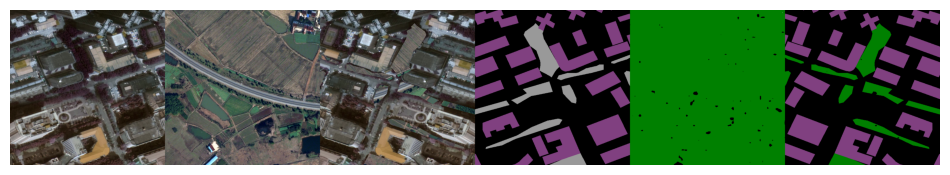

Epoch 1/20 Training:  26%|██▌       | 50/192 [00:28<01:18,  1.82batch/s, loss=30.6, lambda-weight=0.00107] 

Classes from the source domain: [0, 2]


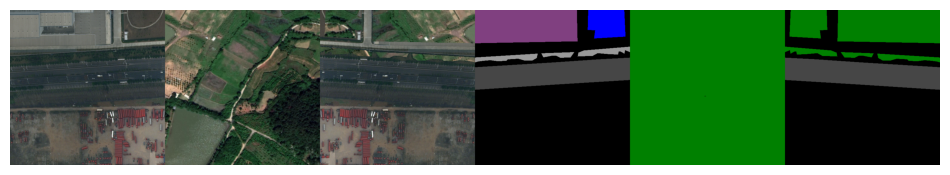

Epoch 1/20 Training:  52%|█████▏    | 100/192 [00:53<00:44,  2.08batch/s, loss=22.3, lambda-weight=0.0111] 

Classes from the source domain: [1, 5, 6]


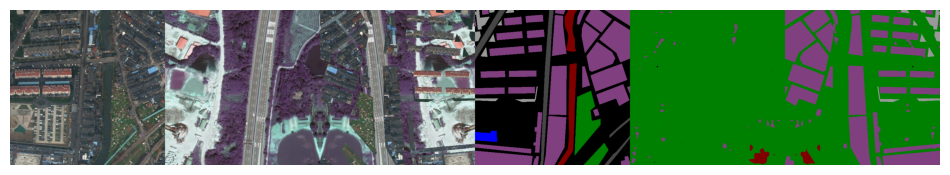

Epoch 1/20 Training:  78%|███████▊  | 150/192 [01:18<00:19,  2.12batch/s, loss=21.2, lambda-weight=0.0795] 

Classes from the source domain: [2, 1, 5]


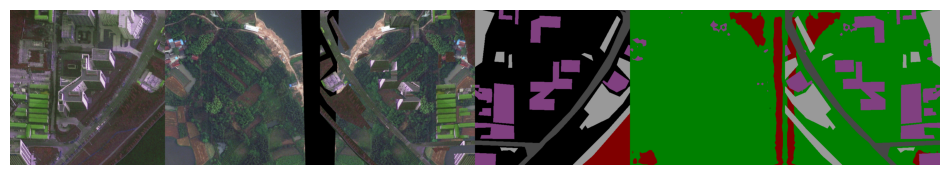

Epoch 1/20 Training: 100%|██████████| 192/192 [01:39<00:00,  1.92batch/s, loss=23.6, lambda-weight=0.0207]


Epoch 1 Training complete. Avg Loss: 28.0727, Avg Lambda: 0.0195


Epoch 1/20 Validation: 100%|██████████| 166/166 [01:34<00:00,  1.76batch/s, valloss=6.8403] 


Epoch 1 Validation complete. Avg Loss: 9.0037
Per-class IoU:
  Class 0: 0.2203
  Class 1: 0.2842
  Class 2: 0.1053
  Class 3: 0.2885
  Class 4: 0.0908
  Class 5: 0.0976
  Class 6: 0.0119
Mean IoU: 0.1569


Epoch 2/20 Training:   4%|▍         | 8/192 [00:05<01:32,  2.00batch/s, loss=28.6, lambda-weight=0.0479]

Classes from the source domain: [4, 0, 3]


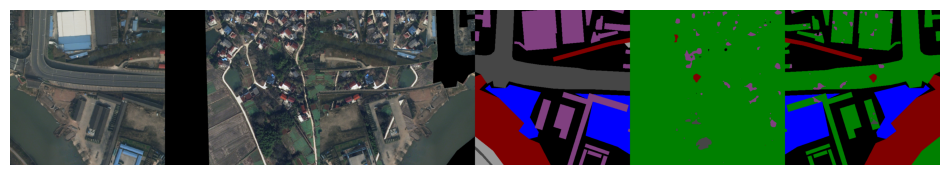

Epoch 2/20 Training:  30%|███       | 58/192 [00:30<01:03,  2.12batch/s, loss=22.1, lambda-weight=0.0644]

Classes from the source domain: [1, 2, 3]


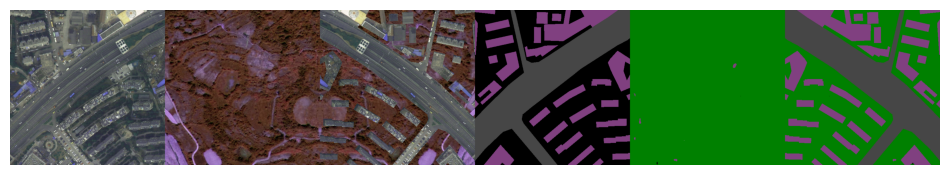

Epoch 2/20 Training:  56%|█████▋    | 108/192 [00:54<00:40,  2.08batch/s, loss=22.8, lambda-weight=0.0875]

Classes from the source domain: [1, 3, 2]


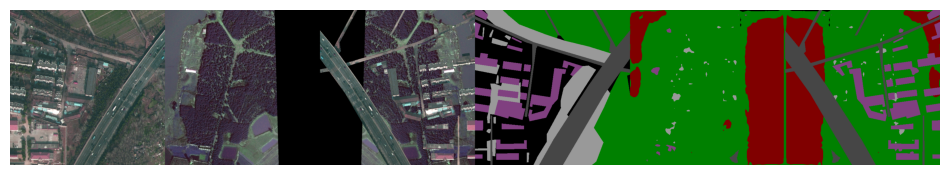

Epoch 2/20 Training:  82%|████████▏ | 158/192 [01:19<00:15,  2.14batch/s, loss=25.9, lambda-weight=0.0231]

Classes from the source domain: [0, 3, 5]


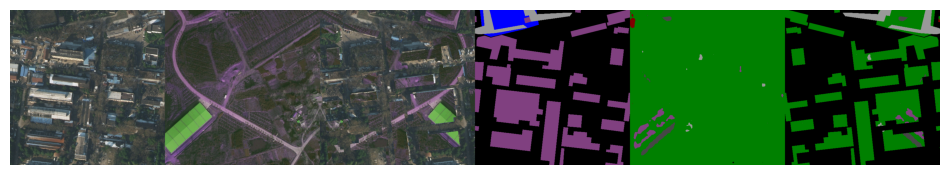

Epoch 2/20 Training: 100%|██████████| 192/192 [01:35<00:00,  2.01batch/s, loss=16.8, lambda-weight=0.0368]


Epoch 2 Training complete. Avg Loss: 22.6727, Avg Lambda: 0.0596


Epoch 2/20 Validation: 100%|██████████| 166/166 [01:03<00:00,  2.61batch/s, valloss=7.9506] 


Epoch 2 Validation complete. Avg Loss: 8.8837
Per-class IoU:
  Class 0: 0.2793
  Class 1: 0.3742
  Class 2: 0.1242
  Class 3: 0.3940
  Class 4: 0.1131
  Class 5: 0.1073
  Class 6: 0.0623
Mean IoU: 0.2078


Epoch 3/20 Training:   8%|▊         | 16/192 [00:09<01:26,  2.04batch/s, loss=24.8, lambda-weight=0.0829]

Classes from the source domain: [4, 2, 0]


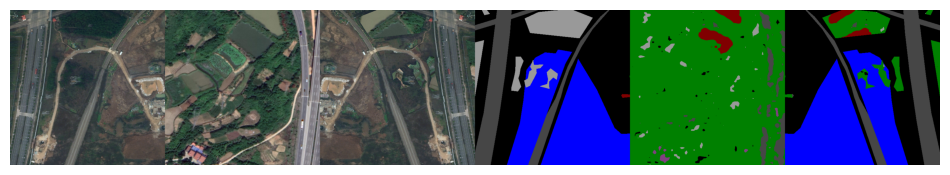

Epoch 3/20 Training:  34%|███▍      | 66/192 [00:33<00:52,  2.42batch/s, loss=19.9, lambda-weight=0.0763]

Classes from the source domain: [4, 5]


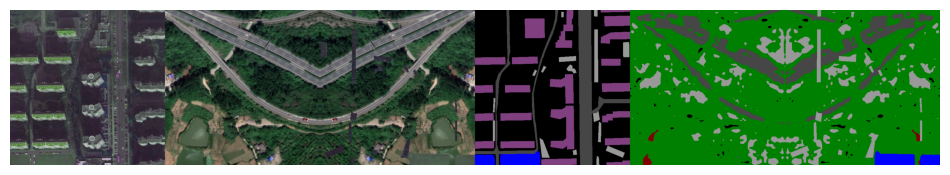

Epoch 3/20 Training:  60%|██████    | 116/192 [00:58<00:36,  2.09batch/s, loss=15, lambda-weight=0.0434]  

Classes from the source domain: [2, 5, 1]


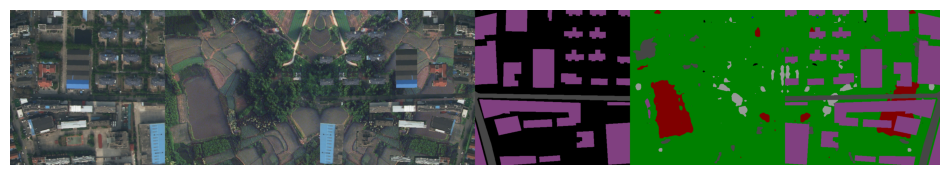

Epoch 3/20 Training:  86%|████████▋ | 166/192 [01:22<00:12,  2.15batch/s, loss=22, lambda-weight=0.0662]  

Classes from the source domain: [3, 5, 0]


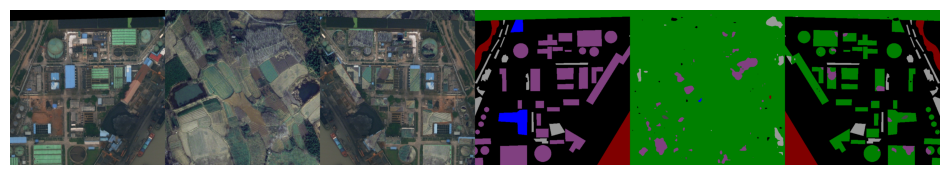

Epoch 3/20 Training: 100%|██████████| 192/192 [01:35<00:00,  2.01batch/s, loss=19.8, lambda-weight=0.0556]


Epoch 3 Training complete. Avg Loss: 19.2347, Avg Lambda: 0.0678


Epoch 3/20 Validation: 100%|██████████| 166/166 [01:03<00:00,  2.63batch/s, valloss=10.8029]


Epoch 3 Validation complete. Avg Loss: 9.2384
Per-class IoU:
  Class 0: 0.2982
  Class 1: 0.3978
  Class 2: 0.1759
  Class 3: 0.5379
  Class 4: 0.0703
  Class 5: 0.2016
  Class 6: 0.2617
Mean IoU: 0.2776


Epoch 4/20 Training:  12%|█▎        | 24/192 [00:13<01:22,  2.04batch/s, loss=18.3, lambda-weight=0.0683]

Classes from the source domain: [5, 0, 2]


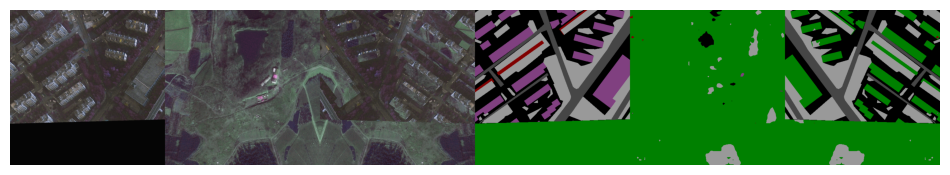

Epoch 4/20 Training:  39%|███▊      | 74/192 [00:38<00:56,  2.07batch/s, loss=16.6, lambda-weight=0.0399]

Classes from the source domain: [6, 5, 1]


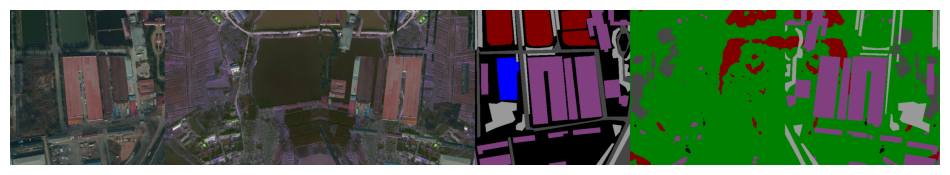

Epoch 4/20 Training:  65%|██████▍   | 124/192 [01:04<00:33,  2.06batch/s, loss=25.5, lambda-weight=0.0559]

Classes from the source domain: [3, 2, 6]


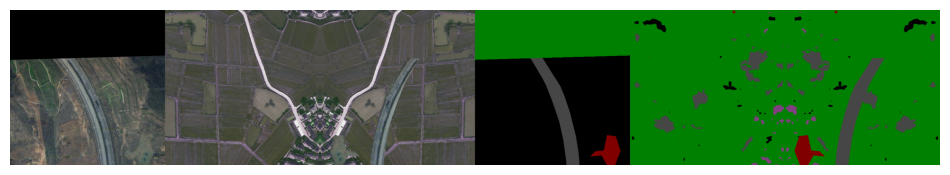

Epoch 4/20 Training:  91%|█████████ | 174/192 [01:29<00:08,  2.09batch/s, loss=15.1, lambda-weight=0.1]   

Classes from the source domain: [4, 5, 3]


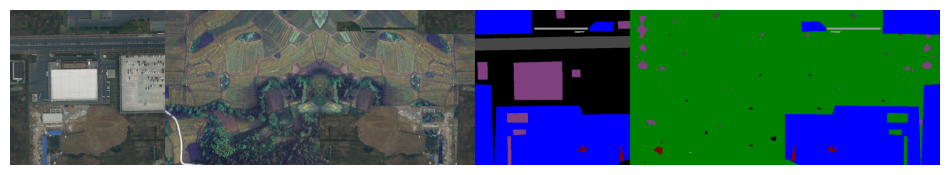

Epoch 4/20 Training: 100%|██████████| 192/192 [01:38<00:00,  1.96batch/s, loss=14.6, lambda-weight=0.0902]


Epoch 4 Training complete. Avg Loss: 17.4588, Avg Lambda: 0.0831


Epoch 4/20 Validation: 100%|██████████| 166/166 [01:03<00:00,  2.61batch/s, valloss=8.2342] 


Epoch 4 Validation complete. Avg Loss: 8.3007
Per-class IoU:
  Class 0: 0.3023
  Class 1: 0.4126
  Class 2: 0.2756
  Class 3: 0.5156
  Class 4: 0.1270
  Class 5: 0.1436
  Class 6: 0.3634
Mean IoU: 0.3057


Epoch 5/20 Training:  17%|█▋        | 32/192 [00:16<01:15,  2.12batch/s, loss=15.2, lambda-weight=0.0939]

Classes from the source domain: [3, 1, 0]


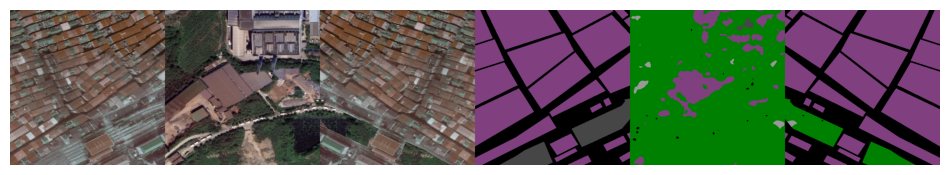

Epoch 5/20 Training:  43%|████▎     | 82/192 [00:41<00:52,  2.11batch/s, loss=15.5, lambda-weight=0.077] 

Classes from the source domain: [5, 1, 6]


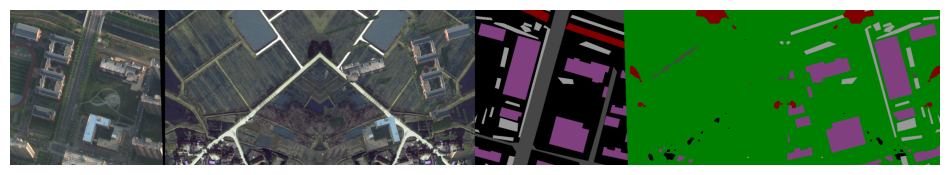

Epoch 5/20 Training:  69%|██████▉   | 132/192 [01:05<00:28,  2.09batch/s, loss=17.8, lambda-weight=0.0971]

Classes from the source domain: [0, 6, 4]


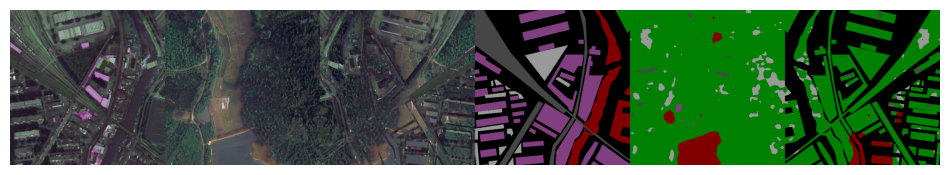

Epoch 5/20 Training:  95%|█████████▍| 182/192 [01:30<00:04,  2.21batch/s, loss=15.2, lambda-weight=0.115] 

Classes from the source domain: [4, 3, 5]


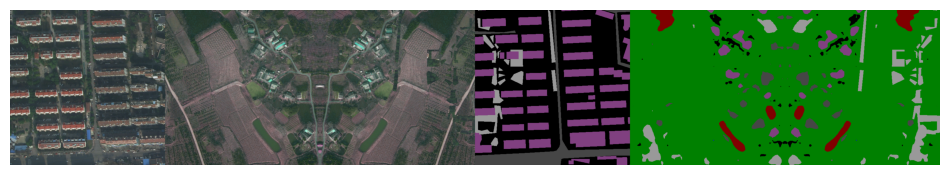

Epoch 5/20 Training: 100%|██████████| 192/192 [01:35<00:00,  2.01batch/s, loss=21.1, lambda-weight=0.0831]


Epoch 5 Training complete. Avg Loss: 17.4791, Avg Lambda: 0.1027


Epoch 5/20 Validation: 100%|██████████| 166/166 [01:03<00:00,  2.61batch/s, valloss=9.9118] 


Epoch 5 Validation complete. Avg Loss: 10.9094
Per-class IoU:
  Class 0: 0.2555
  Class 1: 0.2470
  Class 2: 0.2640
  Class 3: 0.4176
  Class 4: 0.0559
  Class 5: 0.1873
  Class 6: 0.3085
Mean IoU: 0.2480


Epoch 6/20 Training:  21%|██        | 40/192 [00:20<01:10,  2.15batch/s, loss=14.9, lambda-weight=0.131] 

Classes from the source domain: [4, 3, 1]


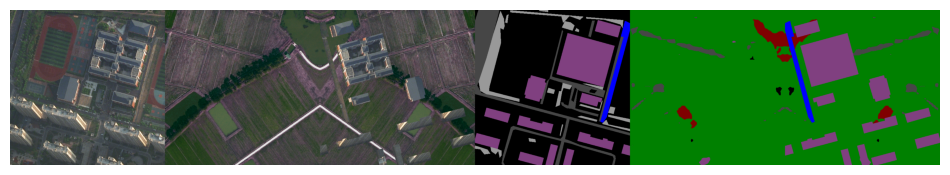

Epoch 6/20 Training:  47%|████▋     | 90/192 [00:44<00:47,  2.16batch/s, loss=17.9, lambda-weight=0.139] 

Classes from the source domain: [1, 5, 4]


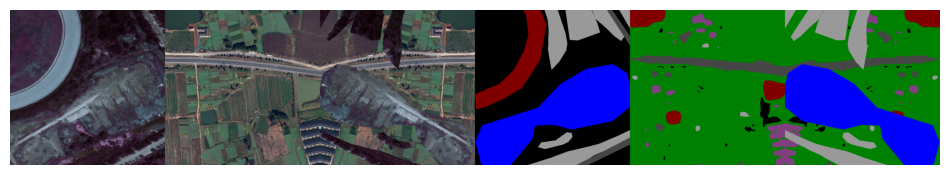

Epoch 6/20 Training:  73%|███████▎  | 140/192 [01:09<00:24,  2.16batch/s, loss=15.7, lambda-weight=0.12] 

Classes from the source domain: [3, 1, 0]


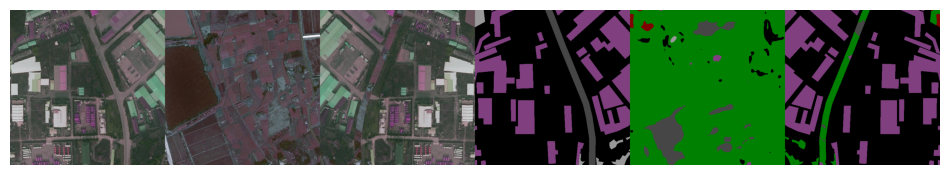

Epoch 6/20 Training:  99%|█████████▉| 190/192 [01:33<00:00,  2.44batch/s, loss=23.3, lambda-weight=0.232] 

Classes from the source domain: [4, 5, 6]


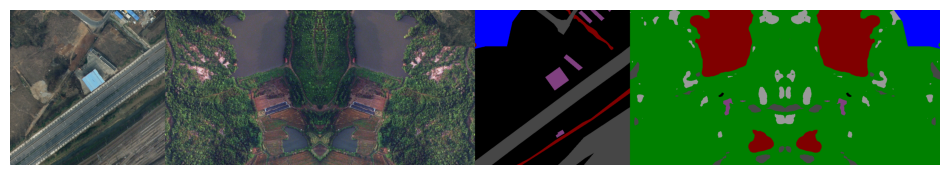

Epoch 6/20 Training: 100%|██████████| 192/192 [01:35<00:00,  2.01batch/s, loss=20.2, lambda-weight=0.179]


Epoch 6 Training complete. Avg Loss: 17.2593, Avg Lambda: 0.1517


Epoch 6/20 Validation: 100%|██████████| 166/166 [01:03<00:00,  2.63batch/s, valloss=8.1352] 


Epoch 6 Validation complete. Avg Loss: 11.2092
Per-class IoU:
  Class 0: 0.5149
  Class 1: 0.3528
  Class 2: 0.1985
  Class 3: 0.3009
  Class 4: 0.0638
  Class 5: 0.0473
  Class 6: 0.3828
Mean IoU: 0.2658


Epoch 7/20 Training:  25%|██▌       | 48/192 [00:24<01:05,  2.21batch/s, loss=21, lambda-weight=0.164]  

Classes from the source domain: [3, 1, 6]


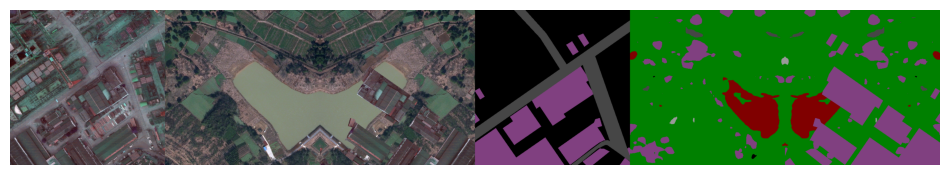

Epoch 7/20 Training:  51%|█████     | 98/192 [00:48<00:43,  2.15batch/s, loss=14.6, lambda-weight=0.197]

Classes from the source domain: [2, 3, 5]


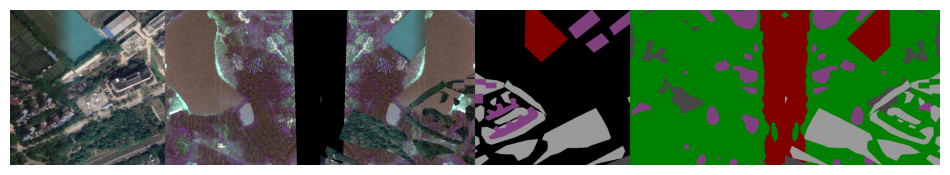

Epoch 7/20 Training:  77%|███████▋  | 148/192 [01:12<00:21,  2.03batch/s, loss=16.7, lambda-weight=0.189]

Classes from the source domain: [2, 5, 6]


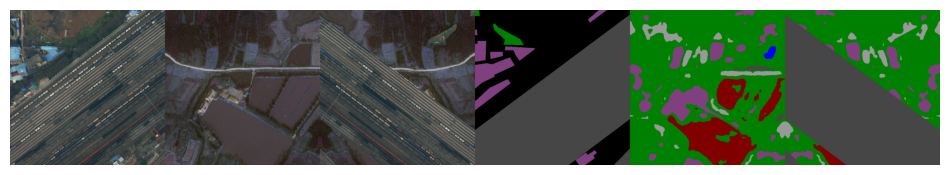

Epoch 7/20 Training: 100%|██████████| 192/192 [01:33<00:00,  2.05batch/s, loss=16.4, lambda-weight=0.183]


Epoch 7 Training complete. Avg Loss: 15.6992, Avg Lambda: 0.1794


Epoch 7/20 Validation: 100%|██████████| 166/166 [01:03<00:00,  2.62batch/s, valloss=4.4090] 


Epoch 7 Validation complete. Avg Loss: 9.8923
Per-class IoU:
  Class 0: 0.3434
  Class 1: 0.3682
  Class 2: 0.2011
  Class 3: 0.4705
  Class 4: 0.0367
  Class 5: 0.2226
  Class 6: 0.4380
Mean IoU: 0.2972


Epoch 8/20 Training:   3%|▎         | 6/192 [00:04<01:50,  1.68batch/s, loss=13.4, lambda-weight=0.191]

Classes from the source domain: [6, 5, 3]


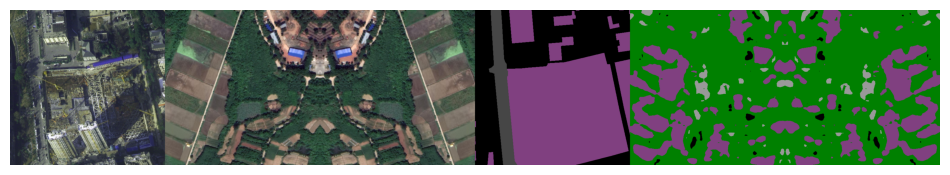

Epoch 8/20 Training:  29%|██▉       | 56/192 [00:29<01:03,  2.13batch/s, loss=11.2, lambda-weight=0.199]

Classes from the source domain: [6, 1, 4]


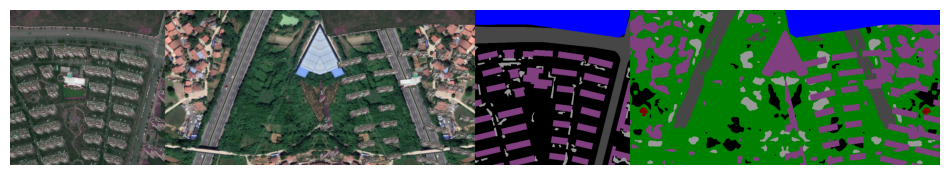

Epoch 8/20 Training:  55%|█████▌    | 106/192 [00:54<00:39,  2.19batch/s, loss=15.3, lambda-weight=0.257]

Classes from the source domain: [2, 3, 0]


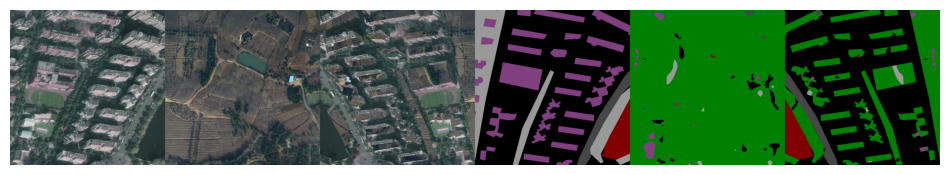

Epoch 8/20 Training:  81%|████████▏ | 156/192 [01:19<00:16,  2.20batch/s, loss=13.4, lambda-weight=0.281]

Classes from the source domain: [4, 5, 3]


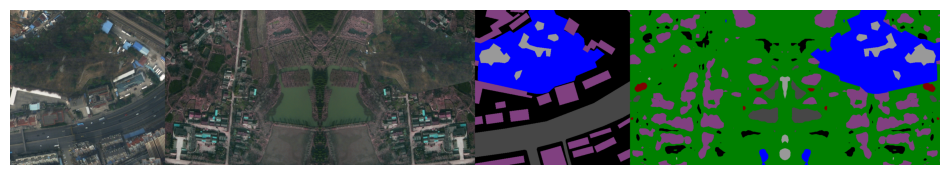

Epoch 8/20 Training: 100%|██████████| 192/192 [01:35<00:00,  2.00batch/s, loss=11.5, lambda-weight=0.192]


Epoch 8 Training complete. Avg Loss: 14.1244, Avg Lambda: 0.2012


Epoch 8/20 Validation: 100%|██████████| 166/166 [01:03<00:00,  2.62batch/s, valloss=7.1902] 


Epoch 8 Validation complete. Avg Loss: 9.4846
Per-class IoU:
  Class 0: 0.3869
  Class 1: 0.4570
  Class 2: 0.2064
  Class 3: 0.4683
  Class 4: 0.0402
  Class 5: 0.1877
  Class 6: 0.3606
Mean IoU: 0.3010


Epoch 9/20 Training:   7%|▋         | 14/192 [00:08<01:26,  2.06batch/s, loss=10.9, lambda-weight=0.219]

Classes from the source domain: [4, 5, 6]


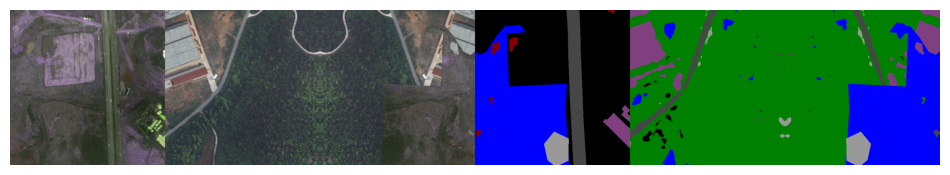

Epoch 9/20 Training:  33%|███▎      | 64/192 [00:34<01:01,  2.08batch/s, loss=11.4, lambda-weight=0.25] 

Classes from the source domain: [0, 4, 6]


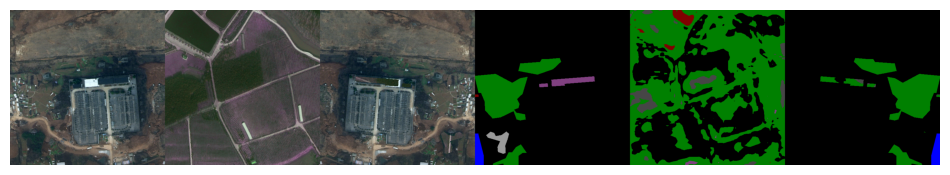

Epoch 9/20 Training:  59%|█████▉    | 114/192 [00:58<00:39,  1.99batch/s, loss=16, lambda-weight=0.207]  

Classes from the source domain: [0, 5, 4]


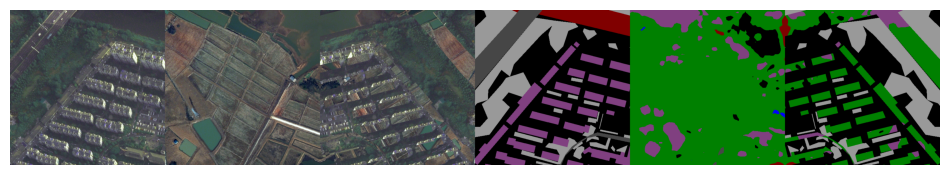

Epoch 9/20 Training:  85%|████████▌ | 164/192 [01:23<00:13,  2.14batch/s, loss=12.8, lambda-weight=0.263]

Classes from the source domain: [5, 6, 2]


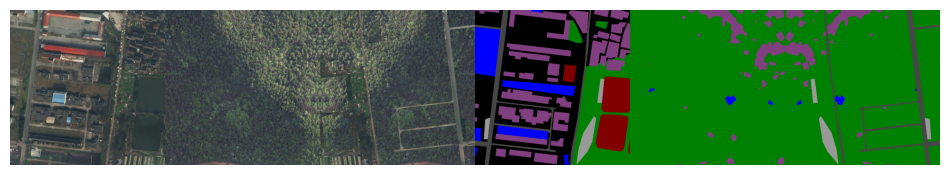

Epoch 9/20 Training: 100%|██████████| 192/192 [01:36<00:00,  1.99batch/s, loss=10.8, lambda-weight=0.272]


Epoch 9 Training complete. Avg Loss: 13.0828, Avg Lambda: 0.2152


Epoch 9/20 Validation: 100%|██████████| 166/166 [01:03<00:00,  2.62batch/s, valloss=6.4818] 


Epoch 9 Validation complete. Avg Loss: 9.1106
Per-class IoU:
  Class 0: 0.4914
  Class 1: 0.3488
  Class 2: 0.2018
  Class 3: 0.5123
  Class 4: 0.1172
  Class 5: 0.2704
  Class 6: 0.3002
Mean IoU: 0.3203


Epoch 10/20 Training:  11%|█▏        | 22/192 [00:12<01:18,  2.15batch/s, loss=14.2, lambda-weight=0.275]

Classes from the source domain: [4, 0, 2]


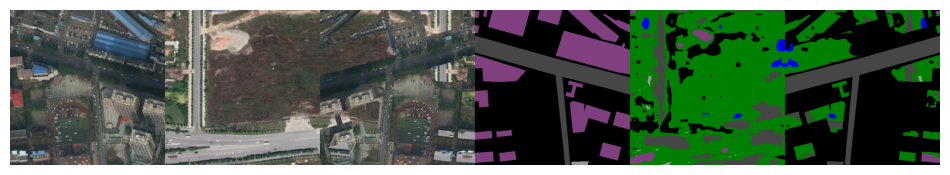

Epoch 10/20 Training:  38%|███▊      | 72/192 [00:36<00:56,  2.14batch/s, loss=12.8, lambda-weight=0.22] 

Classes from the source domain: [5, 2, 4]


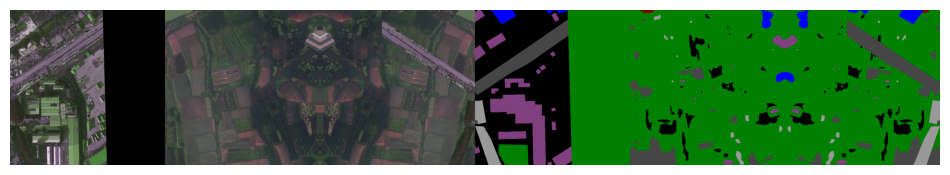

Epoch 10/20 Training:  64%|██████▎   | 122/192 [01:01<00:32,  2.13batch/s, loss=14.1, lambda-weight=0.183]

Classes from the source domain: [3, 4, 2]


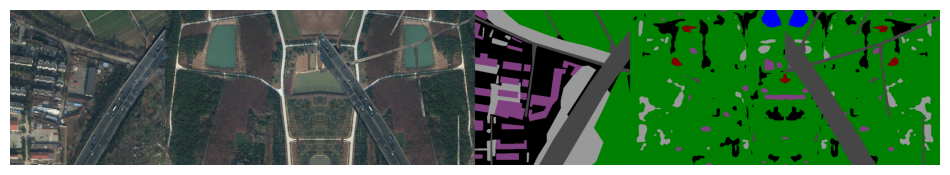

Epoch 10/20 Training:  90%|████████▉ | 172/192 [01:26<00:09,  2.17batch/s, loss=13.2, lambda-weight=0.174]

Classes from the source domain: [2, 5, 0]


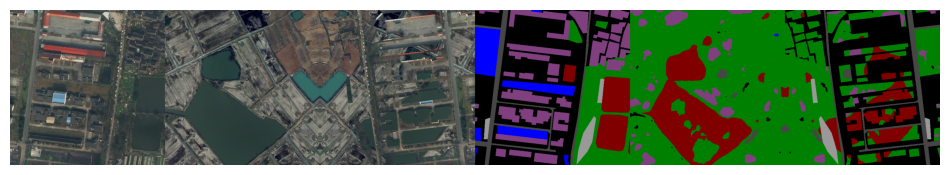

Epoch 10/20 Training: 100%|██████████| 192/192 [01:35<00:00,  2.00batch/s, loss=14.5, lambda-weight=0.194]


Epoch 10 Training complete. Avg Loss: 12.6226, Avg Lambda: 0.2263


Epoch 10/20 Validation: 100%|██████████| 166/166 [01:03<00:00,  2.61batch/s, valloss=5.9158] 


Epoch 10 Validation complete. Avg Loss: 11.8162
Per-class IoU:
  Class 0: 0.5442
  Class 1: 0.3628
  Class 2: 0.2553
  Class 3: 0.4954
  Class 4: 0.0981
  Class 5: 0.1194
  Class 6: 0.4107
Mean IoU: 0.3266


Epoch 11/20 Training:  16%|█▌        | 30/192 [00:16<01:15,  2.15batch/s, loss=10.5, lambda-weight=0.226]

Classes from the source domain: [4, 3, 0]


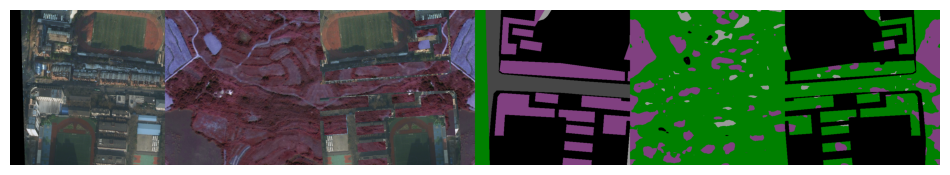

Epoch 11/20 Training:  42%|████▏     | 80/192 [00:40<01:03,  1.77batch/s, loss=8.98, lambda-weight=0.163]

Classes from the source domain: [6, 3, 1]


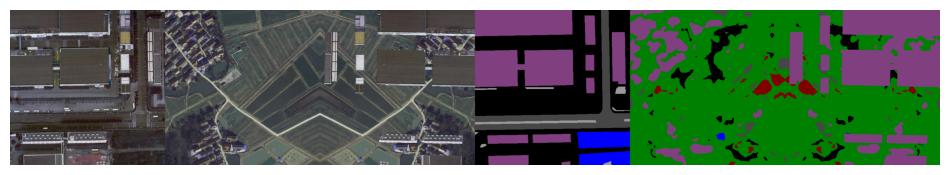

Epoch 11/20 Training:  68%|██████▊   | 130/192 [01:05<00:32,  1.91batch/s, loss=11.7, lambda-weight=0.212]

Classes from the source domain: [2, 3, 5]


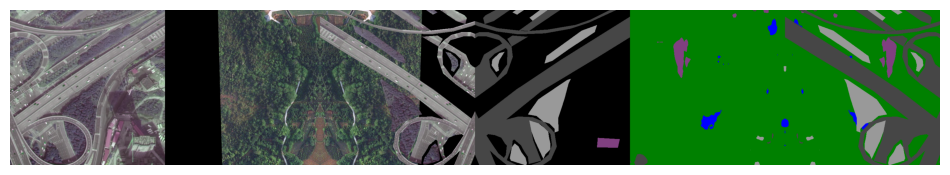

Epoch 11/20 Training:  94%|█████████▍| 180/192 [01:30<00:05,  2.15batch/s, loss=12.7, lambda-weight=0.232]

Classes from the source domain: [2, 0, 4]


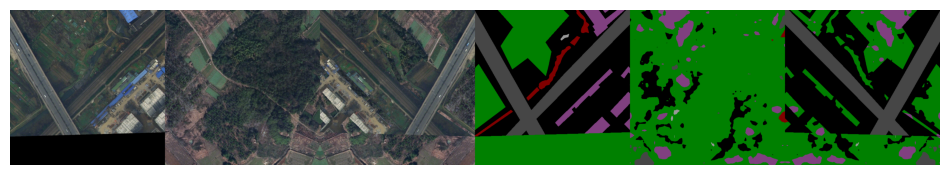

Epoch 11/20 Training: 100%|██████████| 192/192 [01:36<00:00,  2.00batch/s, loss=12.8, lambda-weight=0.207]


Epoch 11 Training complete. Avg Loss: 12.0297, Avg Lambda: 0.2340


Epoch 11/20 Validation: 100%|██████████| 166/166 [01:03<00:00,  2.62batch/s, valloss=10.9468]


Epoch 11 Validation complete. Avg Loss: 11.1502
Per-class IoU:
  Class 0: 0.4330
  Class 1: 0.3676
  Class 2: 0.2171
  Class 3: 0.4529
  Class 4: 0.0892
  Class 5: 0.2348
  Class 6: 0.3738
Mean IoU: 0.3098


Epoch 12/20 Training:  20%|█▉        | 38/192 [00:20<01:13,  2.11batch/s, loss=11.3, lambda-weight=0.219]

Classes from the source domain: [0, 6, 4]


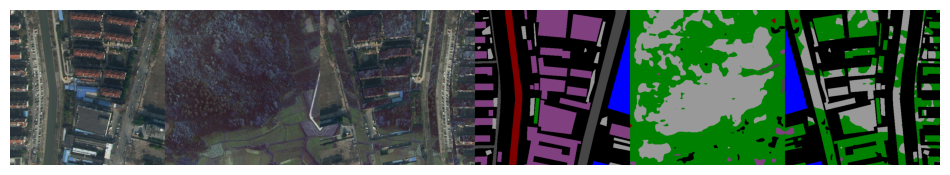

Epoch 12/20 Training:  46%|████▌     | 88/192 [00:44<00:50,  2.05batch/s, loss=11.9, lambda-weight=0.242]

Classes from the source domain: [1, 0, 5]


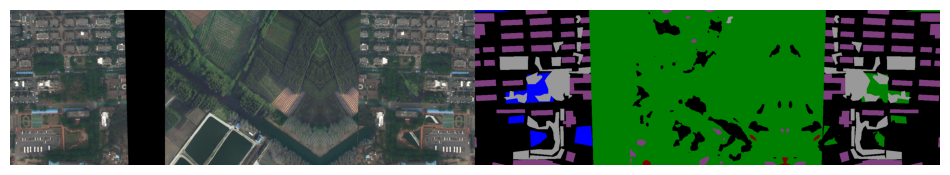

Epoch 12/20 Training:  72%|███████▏  | 138/192 [01:08<00:24,  2.17batch/s, loss=8.24, lambda-weight=0.203]

Classes from the source domain: [2, 0, 5]


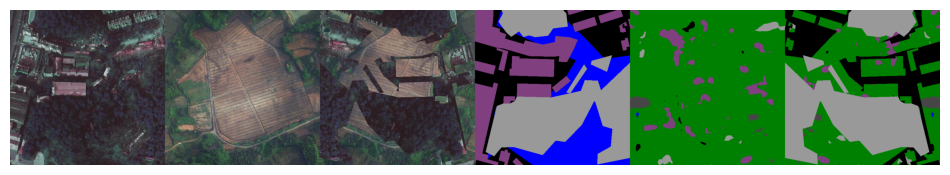

Epoch 12/20 Training:  98%|█████████▊| 188/192 [01:33<00:01,  2.48batch/s, loss=10.9, lambda-weight=0.266]

Classes from the source domain: [2, 3, 1]


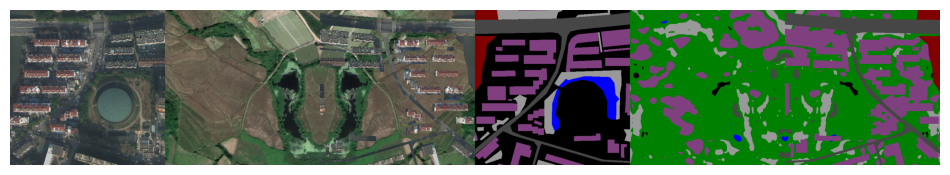

Epoch 12/20 Training: 100%|██████████| 192/192 [01:36<00:00,  2.00batch/s, loss=10.6, lambda-weight=0.305]


Epoch 12 Training complete. Avg Loss: 11.2977, Avg Lambda: 0.2531


Epoch 12/20 Validation: 100%|██████████| 166/166 [01:03<00:00,  2.61batch/s, valloss=10.3608]


Epoch 12 Validation complete. Avg Loss: 13.4297
Per-class IoU:
  Class 0: 0.5100
  Class 1: 0.4747
  Class 2: 0.3420
  Class 3: 0.4911
  Class 4: 0.0969
  Class 5: 0.2258
  Class 6: 0.4555
Mean IoU: 0.3709


Epoch 13/20 Training:  24%|██▍       | 46/192 [00:23<01:06,  2.21batch/s, loss=9.15, lambda-weight=0.309]

Classes from the source domain: [5, 3, 0]


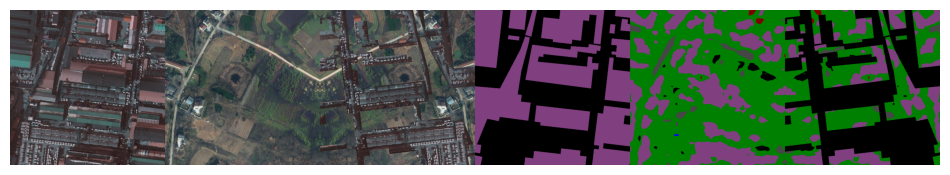

Epoch 13/20 Training:  50%|█████     | 96/192 [00:47<00:44,  2.14batch/s, loss=11.6, lambda-weight=0.223]

Classes from the source domain: [4, 3, 2]


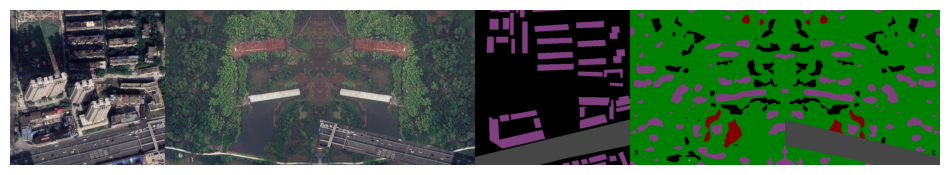

Epoch 13/20 Training:  76%|███████▌  | 146/192 [01:11<00:21,  2.11batch/s, loss=11.2, lambda-weight=0.228]

Classes from the source domain: [1, 2, 4]


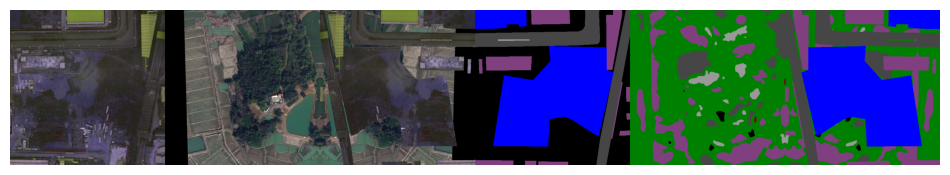

Epoch 13/20 Training: 100%|██████████| 192/192 [01:33<00:00,  2.05batch/s, loss=8.72, lambda-weight=0.253]


Epoch 13 Training complete. Avg Loss: 10.9176, Avg Lambda: 0.2664


Epoch 13/20 Validation: 100%|██████████| 166/166 [01:03<00:00,  2.63batch/s, valloss=4.0101] 


Epoch 13 Validation complete. Avg Loss: 13.0006
Per-class IoU:
  Class 0: 0.5416
  Class 1: 0.3790
  Class 2: 0.2769
  Class 3: 0.4558
  Class 4: 0.1157
  Class 5: 0.1469
  Class 6: 0.4440
Mean IoU: 0.3371


Epoch 14/20 Training:   2%|▏         | 4/192 [00:04<03:08,  1.00s/batch, loss=10.3, lambda-weight=0.27] 

Classes from the source domain: [1, 4, 0]


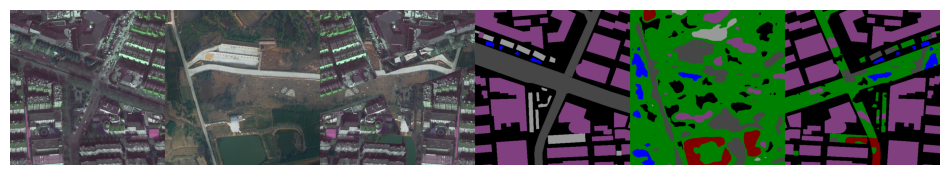

Epoch 14/20 Training:  28%|██▊       | 54/192 [00:29<01:03,  2.18batch/s, loss=11.3, lambda-weight=0.321]

Classes from the source domain: [2, 4, 5]


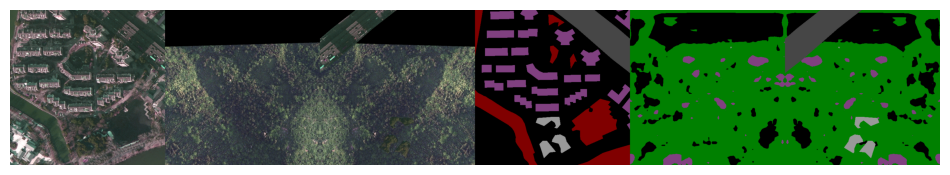

Epoch 14/20 Training:  54%|█████▍    | 104/192 [00:54<00:42,  2.06batch/s, loss=9.33, lambda-weight=0.26] 

Classes from the source domain: [0, 5, 1]


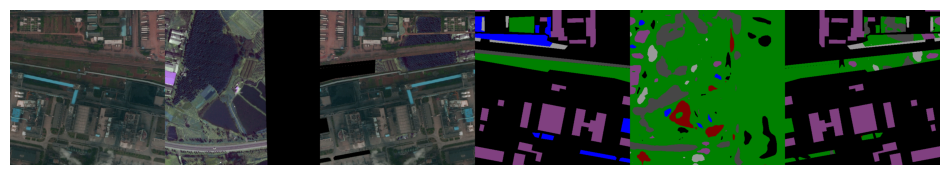

Epoch 14/20 Training:  80%|████████  | 154/192 [01:18<00:17,  2.20batch/s, loss=10.3, lambda-weight=0.301]

Classes from the source domain: [1, 3, 6]


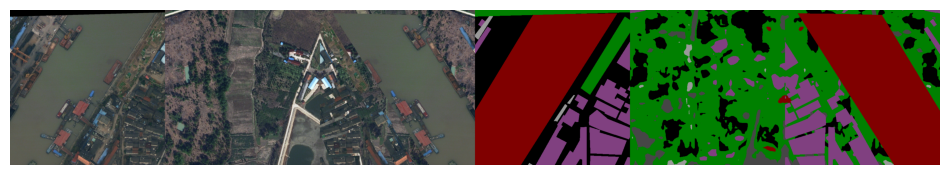

Epoch 14/20 Training: 100%|██████████| 192/192 [01:36<00:00,  2.00batch/s, loss=9.68, lambda-weight=0.313]


Epoch 14 Training complete. Avg Loss: 10.4151, Avg Lambda: 0.2987


Epoch 14/20 Validation: 100%|██████████| 166/166 [01:03<00:00,  2.61batch/s, valloss=6.3914] 


Epoch 14 Validation complete. Avg Loss: 13.0714
Per-class IoU:
  Class 0: 0.5315
  Class 1: 0.4493
  Class 2: 0.3598
  Class 3: 0.4993
  Class 4: 0.1179
  Class 5: 0.0959
  Class 6: 0.4413
Mean IoU: 0.3564


Epoch 15/20 Training:   6%|▋         | 12/192 [00:07<01:26,  2.08batch/s, loss=10.7, lambda-weight=0.307]

Classes from the source domain: [0, 5, 1]


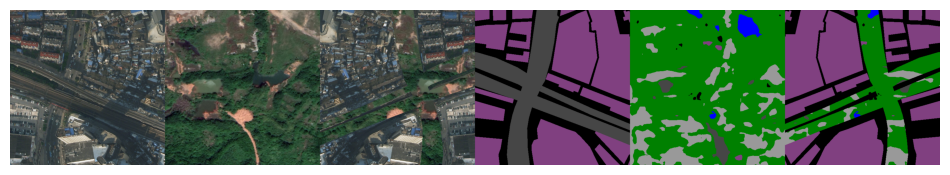

Epoch 15/20 Training:  32%|███▏      | 62/192 [00:32<00:59,  2.18batch/s, loss=10.1, lambda-weight=0.31] 

Classes from the source domain: [2, 3, 5]


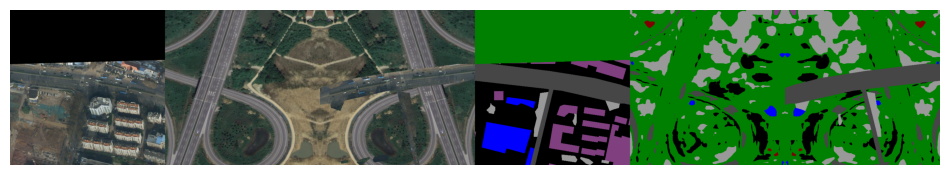

Epoch 15/20 Training:  58%|█████▊    | 112/192 [00:56<00:37,  2.14batch/s, loss=11.2, lambda-weight=0.3]  

Classes from the source domain: [4, 1, 5]


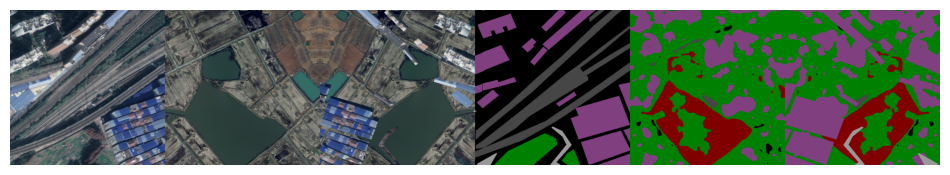

Epoch 15/20 Training:  84%|████████▍ | 162/192 [01:21<00:16,  1.80batch/s, loss=11.5, lambda-weight=0.314]

Classes from the source domain: [2, 3, 5]


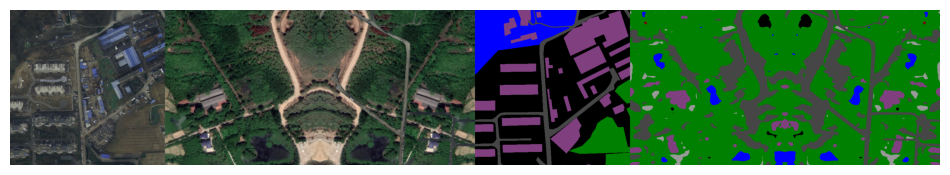

Epoch 15/20 Training: 100%|██████████| 192/192 [01:35<00:00,  2.01batch/s, loss=9.93, lambda-weight=0.332]


Epoch 15 Training complete. Avg Loss: 10.0030, Avg Lambda: 0.3191


Epoch 15/20 Validation: 100%|██████████| 166/166 [01:03<00:00,  2.63batch/s, valloss=6.0533] 


Epoch 15 Validation complete. Avg Loss: 12.5647
Per-class IoU:
  Class 0: 0.4716
  Class 1: 0.4379
  Class 2: 0.3141
  Class 3: 0.4204
  Class 4: 0.0874
  Class 5: 0.2365
  Class 6: 0.4283
Mean IoU: 0.3423


Epoch 16/20 Training:  10%|█         | 20/192 [00:10<01:21,  2.12batch/s, loss=10.5, lambda-weight=0.325]

Classes from the source domain: [3, 6, 4]


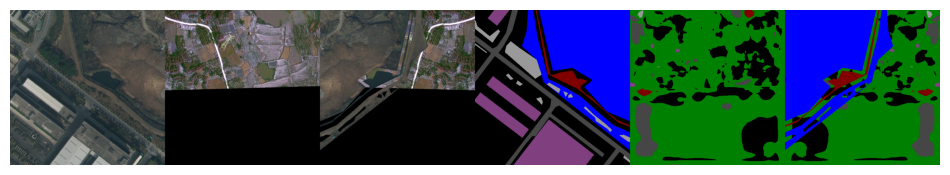

Epoch 16/20 Training:  36%|███▋      | 70/192 [00:35<00:47,  2.56batch/s, loss=7.85, lambda-weight=0.34] 

Classes from the source domain: [2, 0, 5]


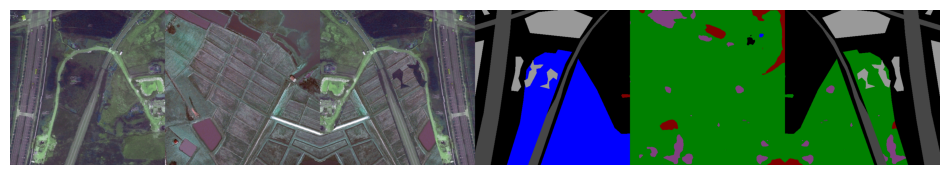

Epoch 16/20 Training:  62%|██████▎   | 120/192 [01:01<00:32,  2.20batch/s, loss=9.87, lambda-weight=0.298]

Classes from the source domain: [0, 2, 4]


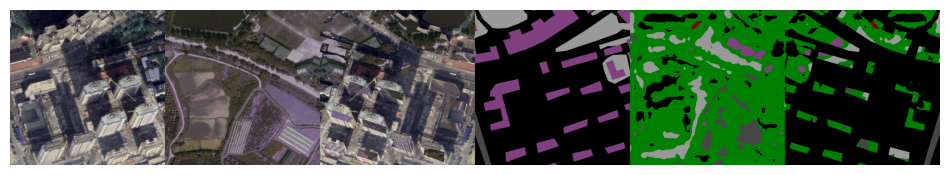

Epoch 16/20 Training:  89%|████████▊ | 170/192 [01:25<00:10,  2.10batch/s, loss=9.72, lambda-weight=0.331]

Classes from the source domain: [6, 4, 0]


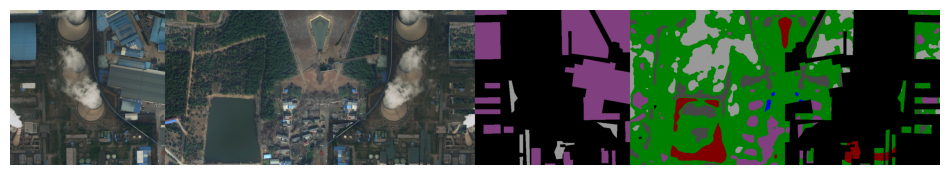

Epoch 16/20 Training: 100%|██████████| 192/192 [01:35<00:00,  2.00batch/s, loss=11.7, lambda-weight=0.309]


Epoch 16 Training complete. Avg Loss: 9.8325, Avg Lambda: 0.3346


Epoch 16/20 Validation: 100%|██████████| 166/166 [01:04<00:00,  2.58batch/s, valloss=6.7567] 


Epoch 16 Validation complete. Avg Loss: 13.8899
Per-class IoU:
  Class 0: 0.5104
  Class 1: 0.4863
  Class 2: 0.3154
  Class 3: 0.4350
  Class 4: 0.1263
  Class 5: 0.2538
  Class 6: 0.4224
Mean IoU: 0.3642


Epoch 17/20 Training:  15%|█▍        | 28/192 [00:14<01:17,  2.11batch/s, loss=8.39, lambda-weight=0.337]

Classes from the source domain: [0, 4]


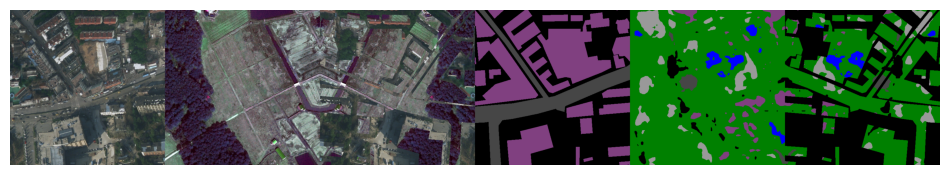

Epoch 17/20 Training:  41%|████      | 78/192 [00:39<00:52,  2.17batch/s, loss=9.29, lambda-weight=0.321]

Classes from the source domain: [0, 5, 4]


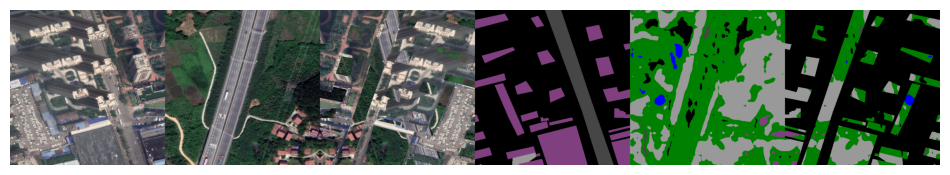

Epoch 17/20 Training:  67%|██████▋   | 128/192 [01:06<00:29,  2.15batch/s, loss=11.6, lambda-weight=0.379]

Classes from the source domain: [5, 0, 2]


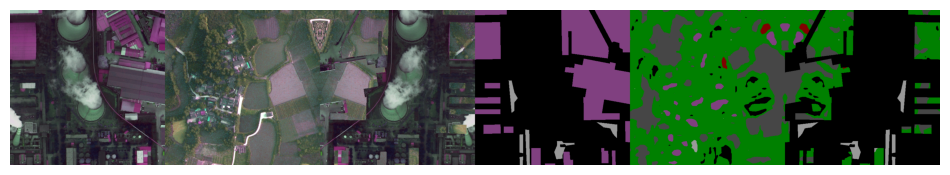

Epoch 17/20 Training:  93%|█████████▎| 178/192 [01:31<00:06,  2.11batch/s, loss=10.1, lambda-weight=0.343]

Classes from the source domain: [3, 4, 0]


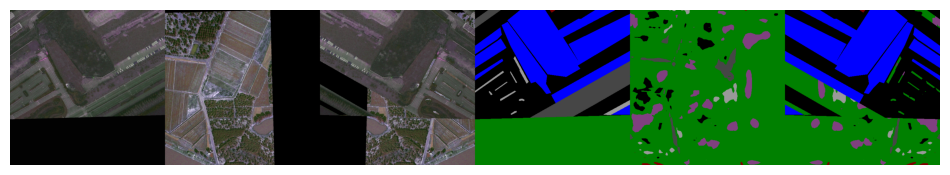

Epoch 17/20 Training: 100%|██████████| 192/192 [01:38<00:00,  1.96batch/s, loss=8.33, lambda-weight=0.264]


Epoch 17 Training complete. Avg Loss: 9.5942, Avg Lambda: 0.3466


Epoch 17/20 Validation: 100%|██████████| 166/166 [01:05<00:00,  2.55batch/s, valloss=6.7616] 


Epoch 17 Validation complete. Avg Loss: 15.5547
Per-class IoU:
  Class 0: 0.5333
  Class 1: 0.4096
  Class 2: 0.2676
  Class 3: 0.5028
  Class 4: 0.1531
  Class 5: 0.1635
  Class 6: 0.3842
Mean IoU: 0.3449


Epoch 18/20 Training:  19%|█▉        | 36/192 [00:18<01:14,  2.08batch/s, loss=9.28, lambda-weight=0.394]

Classes from the source domain: [3, 0, 1]


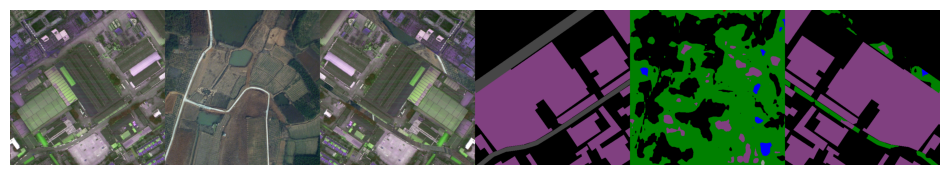

Epoch 18/20 Training:  45%|████▍     | 86/192 [00:43<00:51,  2.05batch/s, loss=9.35, lambda-weight=0.284]

Classes from the source domain: [4, 1, 5]


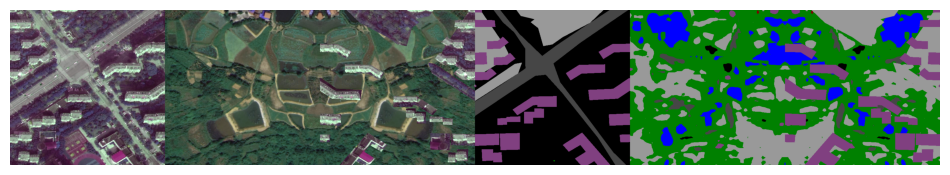

Epoch 18/20 Training:  71%|███████   | 136/192 [01:07<00:22,  2.47batch/s, loss=7.34, lambda-weight=0.379]

Classes from the source domain: [4, 6, 3]


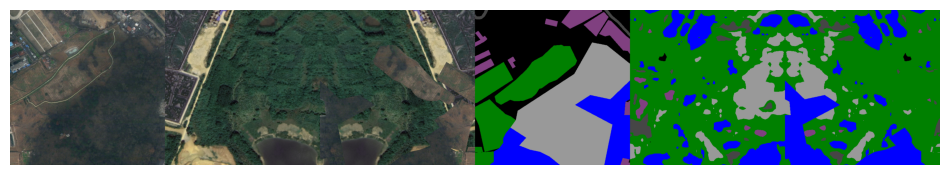

Epoch 18/20 Training:  97%|█████████▋| 186/192 [01:33<00:02,  2.30batch/s, loss=8.91, lambda-weight=0.431]

Classes from the source domain: [1, 5, 0]


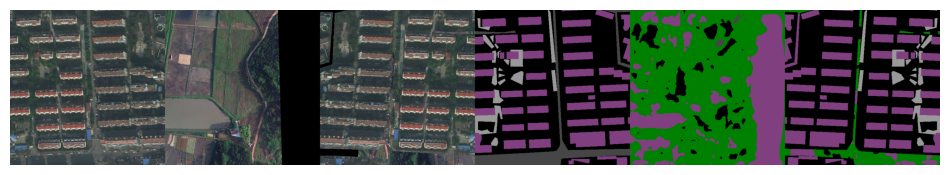

Epoch 18/20 Training: 100%|██████████| 192/192 [01:36<00:00,  1.99batch/s, loss=9.74, lambda-weight=0.34] 


Epoch 18 Training complete. Avg Loss: 9.3387, Avg Lambda: 0.3606


Epoch 18/20 Validation: 100%|██████████| 166/166 [01:03<00:00,  2.60batch/s, valloss=4.9878] 


Epoch 18 Validation complete. Avg Loss: 13.1946
Per-class IoU:
  Class 0: 0.5099
  Class 1: 0.4340
  Class 2: 0.2557
  Class 3: 0.4863
  Class 4: 0.0918
  Class 5: 0.2691
  Class 6: 0.4137
Mean IoU: 0.3515


Epoch 19/20 Training:  23%|██▎       | 44/192 [00:22<01:07,  2.21batch/s, loss=8.73, lambda-weight=0.295]

Classes from the source domain: [4, 2, 0]


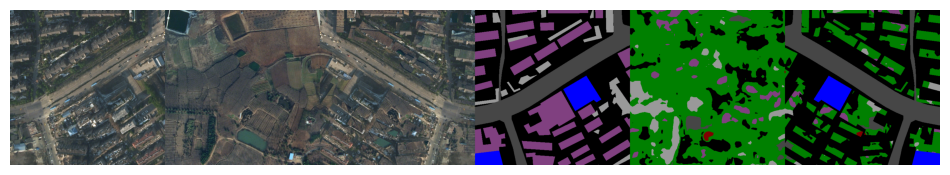

Epoch 19/20 Training:  49%|████▉     | 94/192 [00:46<00:43,  2.23batch/s, loss=6.8, lambda-weight=0.339] 

Classes from the source domain: [6, 2, 0]


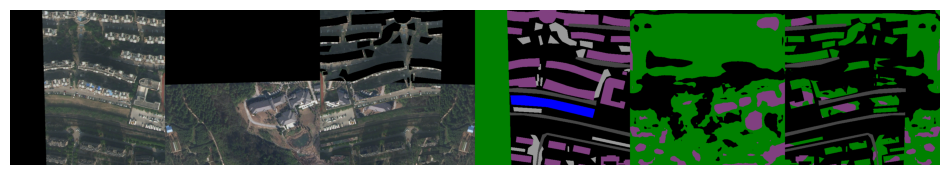

Epoch 19/20 Training:  75%|███████▌  | 144/192 [01:10<00:22,  2.10batch/s, loss=7.86, lambda-weight=0.372]

Classes from the source domain: [2, 1, 0]


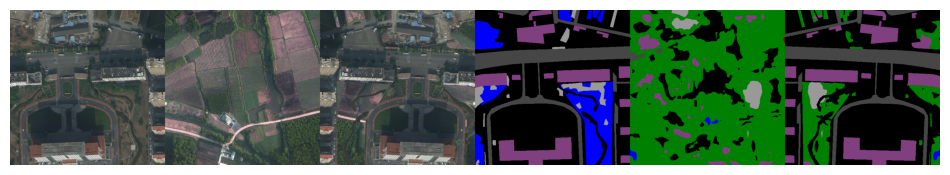

Epoch 19/20 Training: 100%|██████████| 192/192 [01:34<00:00,  2.02batch/s, loss=9.64, lambda-weight=0.417]


Epoch 19 Training complete. Avg Loss: 9.1756, Avg Lambda: 0.3692


Epoch 19/20 Validation: 100%|██████████| 166/166 [01:04<00:00,  2.57batch/s, valloss=5.7465] 


Epoch 19 Validation complete. Avg Loss: 13.4812
Per-class IoU:
  Class 0: 0.5026
  Class 1: 0.4147
  Class 2: 0.3091
  Class 3: 0.4777
  Class 4: 0.1116
  Class 5: 0.2687
  Class 6: 0.4106
Mean IoU: 0.3564


Epoch 20/20 Training:   1%|          | 2/192 [00:02<03:31,  1.11s/batch, loss=8.27, lambda-weight=0.363]

Classes from the source domain: [1, 3, 5]


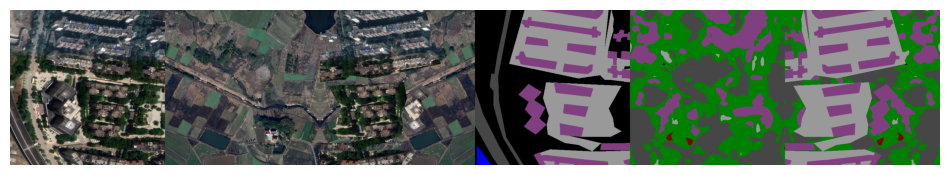

Epoch 20/20 Training:  27%|██▋       | 52/192 [00:27<01:06,  2.12batch/s, loss=9.29, lambda-weight=0.382]

Classes from the source domain: [6, 4, 1]


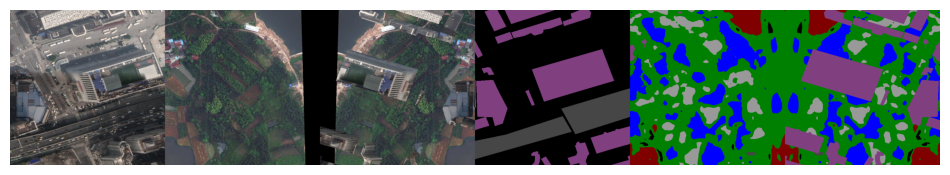

Epoch 20/20 Training:  53%|█████▎    | 102/192 [00:51<00:47,  1.88batch/s, loss=11.3, lambda-weight=0.409]

Classes from the source domain: [5, 2]


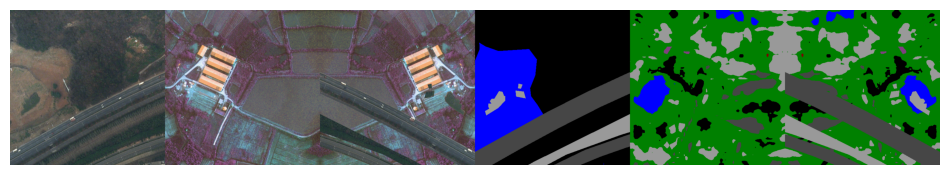

Epoch 20/20 Training:  79%|███████▉  | 152/192 [01:15<00:18,  2.17batch/s, loss=9.32, lambda-weight=0.33] 

Classes from the source domain: [5, 2, 0]


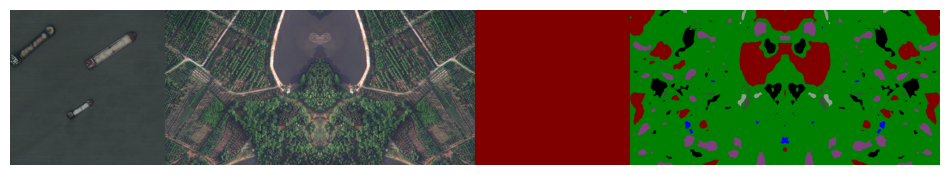

Epoch 20/20 Training: 100%|██████████| 192/192 [01:35<00:00,  2.02batch/s, loss=9.11, lambda-weight=0.342]


Epoch 20 Training complete. Avg Loss: 9.0810, Avg Lambda: 0.3804


Epoch 20/20 Validation: 100%|██████████| 166/166 [01:06<00:00,  2.51batch/s, valloss=6.1797] 


Epoch 20 Validation complete. Avg Loss: 13.9137
Per-class IoU:
  Class 0: 0.5057
  Class 1: 0.4501
  Class 2: 0.2948
  Class 3: 0.5059
  Class 4: 0.0974
  Class 5: 0.2655
  Class 6: 0.3870
Mean IoU: 0.3581


In [ ]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
import argparse
import logging
import time
import datetime
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from tqdm import tqdm
from loveda import LoveDA
from models.model_stages import BiSeNet
from loss.loss import WeightedOhemCELoss, OhemCELoss
from loss.detail_loss import DetailAggregateLoss
from optimizer_loss import Optimizer
import torch.optim as optim
# Configuration
def parse_args():
    parser = argparse.ArgumentParser(description='STDC Segmentation Training')
    parser.add_argument('--epochs', type=int, default=20, help='number of training epochs')
    parser.add_argument('--batch_size', type=int, default=6, help='images per batch')
    parser.add_argument('--n_workers_train', type=int, default=4)
    parser.add_argument('--n_workers_val', type=int, default=0)
    parser.add_argument('--cropsize', type=int, nargs=2, default=[256, 256])
    parser.add_argument('--randomscale', type=float, nargs='+',
                        default=[0.125, 0.25, 0.375, 0.5, 0.625, 0.75, 0.875, 1.0, 1.125, 1.25, 1.375, 1.5])
    parser.add_argument('--backbone', type=str, default='STDCNet813')
    parser.add_argument('--pretrain_path', type=str, default='/kaggle/working/STDC-Seg/pretrained_models/STDCNet813M_73.91.tar')
    parser.add_argument('--ckpt', type=str, default=None)
    parser.add_argument('--respath', type=str, default='/kaggle/working/output')
    parser.add_argument('--use_conv_last', action='store_true')
    parser.add_argument('--use_boundary_2', action='store_true')
    parser.add_argument('--use_boundary_4', action='store_true')
    parser.add_argument('--use_boundary_8', action='store_true')
    parser.add_argument('--use_boundary_16', action='store_true')
    parser.add_argument('--vis_mix', action='store_true',
                    help='show / save a grid of mixed images every N iters')
    parser.add_argument('--vis_freq', type=int, default=1,
                        help='visualise every N training iterations')
    parser.add_argument('--vis_dir',  type=str, default='mix_vis',
                        help='folder to write PNGs (created automatically)')
    return parser.parse_args(args=[] if '__file__' not in globals() else None)

def update_ema_variables(ema_model, model, alpha_teacher, iteration):
    # Use the "true" average until the exponential average is more correct
    alpha_teacher = min(1 - 1 / (iteration + 1), alpha_teacher)
    for ema_param, param in zip(ema_model.parameters(), model.parameters()):
        #ema_param.data.mul_(alpha).add_(1 - alpha, param.data)
        ema_param.data[:] = alpha_teacher * ema_param[:].data[:] + (1 - alpha_teacher) * param[:].data[:]
    return ema_model


# Metrics
def compute_iou(pred, target, num_classes, ignore_index=255):
    ious = []
    pred = pred.view(-1)
    target = target.view(-1)
    for cls in range(num_classes):
        mask = target == cls
        if mask.sum().item() == 0:
            ious.append(float('nan'))
            continue
        inter = ((pred == cls) & mask).sum().item()
        union = ((pred == cls) | mask).sum().item()
        ious.append(inter / union if union > 0 else float('nan'))
    miou = np.nanmean(ious)
    return ious, miou

# Training loop
def train():
    args = parse_args()
    os.makedirs(args.respath, exist_ok=True)
    logging.basicConfig(level=logging.INFO)
    logger = logging.getLogger()

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    n_classes = 7
    ignore_idx = 255

    # Dataset and DataLoader
    ds_train = LoveDA('/kaggle/input/loveda-splits', cropsize=args.cropsize,
                      mode='train', randomscale=tuple(args.randomscale), resolution=(512, 512), apply_augmentation=True)
    dl_train = DataLoader(ds_train, batch_size=args.batch_size, shuffle=True,
                          num_workers=args.n_workers_train, pin_memory=True, drop_last=True)
    ds_target = LoveDA('/kaggle/input/loveda-splits', cropsize=args.cropsize,
                      mode='target', randomscale=tuple(args.randomscale), resolution=(512, 512), apply_augmentation=True)
    
    dl_target = DataLoader(ds_target, batch_size=args.batch_size, shuffle=True,
                          num_workers=args.n_workers_train, pin_memory=True, drop_last=True)
    
    ds_val = LoveDA('/kaggle/input/loveda-splits', mode='val', randomscale=tuple(args.randomscale), resolution=(512, 512))
    dl_val = DataLoader(ds_val, batch_size=args.batch_size, shuffle=False,
                        num_workers=args.n_workers_val, pin_memory=True, drop_last=False)

    logger.info(f"Train samples: {len(ds_train)}, Val samples: {len(ds_val)}")

    # Model
    net = BiSeNet(backbone=args.backbone, n_classes=n_classes,
                  pretrain_model=args.pretrain_path,
                  use_boundary_2=args.use_boundary_2,
                  use_boundary_4=args.use_boundary_4,
                  use_boundary_8=args.use_boundary_8,
                  use_boundary_16=args.use_boundary_16,
                  use_conv_last=args.use_conv_last)
    if args.ckpt:
        net.load_state_dict(torch.load(args.ckpt, map_location='cpu'))
    net = net.to(device)
    net = nn.DataParallel(net)
    ema_model = create_ema_model(net)
    # Losses and Optimizer
    n_min = args.batch_size * args.cropsize[0] * args.cropsize[1] // 16
    
    criteria = {
        'p': WeightedOhemCELoss(0.7, n_min, 7, ignore_lb=ignore_idx),
        '16': WeightedOhemCELoss(0.7, n_min, 7, ignore_lb=ignore_idx),
        '32': WeightedOhemCELoss(0.7, n_min, 7, ignore_lb=ignore_idx)
    }

    criteria_mixed = {
        'p': nn.CrossEntropyLoss(ignore_index=ignore_idx, weight=torch.tensor([0.116411, 0.266041, 0.607794, 1.511413, 0.745507, 0.712438, 3.040396]).cuda()),
        '16': nn.CrossEntropyLoss(ignore_index=ignore_idx, weight=torch.tensor([0.116411, 0.266041, 0.607794, 1.511413, 0.745507, 0.712438, 3.040396]).cuda()),
        '32': nn.CrossEntropyLoss(ignore_index=ignore_idx, weight=torch.tensor([0.116411, 0.266041, 0.607794, 1.511413, 0.745507, 0.712438, 3.040396]).cuda())
    }
    
    boundary_loss = DetailAggregateLoss()
    optimizer = Optimizer(model=net.module, loss=boundary_loss,
                          lr0=1e-3, momentum=0.9, wd=5e-4,
                          warmup_steps=1000, warmup_start_lr=1e-5,
                          max_iter=len(dl_train)*args.epochs,
                          power=0.9)
    
    target_iter = iter(dl_target)

    
    # Epoch loop
    best_miou = 0.0
    iteration = 0
    for epoch in range(1, args.epochs + 1):
        # -- Training --
        net.train()
        running_loss = 0.0
        running_lambda_weight = 0.0
        last_avg_lambda_weight = 0.0
        lambda_weight = 0.001
        train_bar = tqdm(dl_train, desc=f"Epoch {epoch}/{args.epochs} Training", unit="batch")
        for imgs, lbs in train_bar:
            imgs = imgs.to(device)
            lbs = lbs.squeeze(1).to(device)

            try:
                imgs_target, _ = next(target_iter)
            except StopIteration:
                target_iter = iter(dl_target)
                imgs_target, _ = next(target_iter)
            imgs_target = imgs_target.to(device)


            with torch.no_grad():
                logits_t = ema_model(imgs_target)[0]  
                pseudo_t = torch.argmax(logits_t, dim=1)
                conf_t = torch.softmax(logits_t, dim=1).max(dim=1)[0]
            
            # Confidence_mask tells the position of the pixel whose pseudo-labels have
            # a confidence higher than  the threshold
            confidence_mask = conf_t > 0.75


            # Where confidence mask is True put the pixel from pseudo_t, otherwise insert the ignore label (255)
            pseudo_t_filtered = torch.where(
               confidence_mask,
               pseudo_t,
               torch.tensor(ignore_idx, device=pseudo_t.device)
            )

            verbose = False
            if iteration % 50 == 0:
                verbose = True
            
            imgs_mixed, lbs_mixed, source_mask = classmix(imgs, lbs, imgs_target, pseudo_t_filtered, deterministic=False, verbose=verbose)
            # Horizontal flip
            imgs_mixed = torch.flip(imgs_mixed, dims=[3])
            lbs_mixed  = torch.flip(lbs_mixed,  dims=[2])

            # ------------- VISUALISATION ---------------------------------
            show = True
            if show and iteration % 50 == 0:
                os.makedirs(args.vis_dir, exist_ok=True)
            
                k = min(1, imgs.size(0))          # show up to 4 samples
                grid = []
            
                for i in range(k):
                    s_rgb = tensor_to_img(imgs[i])
                    t_rgb = tensor_to_img(imgs_target[i])
                    m_rgb = tensor_to_img(imgs_mixed[i])
            
                    s_msk = colourise_mask(lbs[i])
                    t_msk = colourise_mask(pseudo_t_filtered[i])
                    m_msk = colourise_mask(lbs_mixed[i])
            
                    # row = [src RGB, tgt RGB, mix RGB, src mask, tgt mask, mix mask]
                    row = torch.cat([s_rgb, t_rgb, m_rgb, s_msk, t_msk, m_msk], dim=2)
                    grid.append(row)
            
                grid = torch.cat(grid, dim=1)      # [3, H*k, W*6]
                """vutils.save_image(grid,
                    os.path.join(args.vis_dir, f'iter_{iteration:06d}.png'))"""
                import matplotlib.pyplot as plt
                import torchvision.utils as vutils
                from PIL import Image
                plt.figure(figsize=(12,4))
                # Save to file first
                vis_path = os.path.join(args.vis_dir, f'iter_{iteration:06d}.png')
                vutils.save_image(grid, vis_path)
                
                # Show explicitly in notebook (if inside notebook cell)
                img = Image.open(vis_path)
                plt.imshow(img)
                plt.axis('off')
                plt.show()
            # ----------------------------------------------------------------
            iteration+=1
            
            '''# Source images augmentation
            imgs, lbs = imgs.cpu(), lbs.cpu()

            # Apply augmentation to batch
            imgs, lbs = augment_batch(imgs, lbs)
            
            
            imgs, lbs = imgs.cuda(), lbs.cuda()

            # Mixed images augmentation
            # Apply to batch
            imgs_mixed, lbs_mixed = augment_batch(imgs_mixed, lbs_mixed)'''

            imgs_mixed = imgs_mixed.cuda()            
            lbs_mixed = lbs_mixed.cuda()
            
            optimizer.zero_grad()
            outputs = net(imgs)
            outputs_mixed = net(imgs_mixed)
            
            out, out16, out32 = outputs[:3]
            out_mixed, out16_mixed, out32_mixed = outputs_mixed[:3]

            lp = criteria['p'](out, lbs)
            l16 = criteria['16'](out16, lbs)
            l32 = criteria['32'](out32, lbs)
            lp_mixed = criteria_mixed['p'](out_mixed, lbs_mixed)
            l16_mixed = criteria_mixed['16'](out16_mixed, lbs_mixed)
            l32_mixed = criteria_mixed['32'](out32_mixed, lbs_mixed)
            lbce, ldice = 0.0, 0.0
            lbce_mixed, ldice_mixed = 0.0, 0.0
            if args.use_boundary_2 or args.use_boundary_4 or args.use_boundary_8 or args.use_boundary_16:
                for det in outputs[3:]:
                    bce, dice = boundary_loss(det, lbs)
                    lbce += bce
                    ldice += dice
                
                for det in outputs_mixed[3:]:
                    bce_mixed, dice_mixed = boundary_loss(det, lbs_mixed)
                    lbce_mixed += bce_mixed
                    ldice_mixed += dice_mixed

            avg_confidence = confidence_mask.float().mean().item()
    
            lambda_weight = 0.001 * epoch
            
            loss = lp + l16 + l32 + lbce + ldice + lambda_weight * (lp_mixed + l16_mixed + l32_mixed + lbce_mixed + ldice_mixed)
            loss.backward()
            optimizer.step()

            alpha_teacher = 0.20
            ema_model = update_ema_variables(ema_model, net, alpha_teacher, iteration)
            
            running_loss += loss.item()
            
            running_lambda_weight += avg_confidence
            dict_info = {
                'loss': loss.item(),
                'lambda-weight': avg_confidence
            }
            train_bar.set_postfix(dict_info)

        avg_train_loss = running_loss / len(dl_train)
        avg_lambda_weight = running_lambda_weight / len(dl_train)
        last_avg_lambda_weight = avg_lambda_weight
        print(f"Epoch {epoch} Training complete. Avg Loss: {avg_train_loss:.4f}, Avg Lambda: {avg_lambda_weight:.4f}")
        logger.info(f"Epoch [{epoch}/{args.epochs}] Train Loss: {avg_train_loss:.4f}")

        # -- Validation --
        net.eval()
        running_val_loss = 0.0
        intersection = torch.zeros(n_classes, dtype=torch.float64)
        union        = torch.zeros(n_classes, dtype=torch.float64)
        val_bar = tqdm(dl_val, desc=f"Epoch {epoch}/{args.epochs} Validation", unit="batch")
        with torch.no_grad():
            for imgs, lbs in val_bar:
                imgs = imgs.to(device)
                lbs = lbs.squeeze(1).to(device)
                outputs = net(imgs)
                out = outputs[0]

                # validation loss
                lval = criteria['p'](out, lbs)
                running_val_loss += lval.item()
                val_bar.set_postfix(valloss=f"{lval.item():.4f}")

                pred = torch.argmax(out, dim=1)
                for cls in range(n_classes):
                    mask = (lbs == cls)
                    if mask.sum().item() == 0:
                        continue
                    inter = ((pred == cls) & mask).sum().item()
                    uni   = ((pred == cls) | mask).sum().item()
                    intersection[cls] += inter
                    union[cls]        += uni

        avg_val_loss = running_val_loss / len(dl_val)
        print(f"Epoch {epoch} Validation complete. Avg Loss: {avg_val_loss:.4f}")
        logger.info(f"Epoch [{epoch}/{args.epochs}] Val Loss: {avg_val_loss:.4f}")

        ious = (intersection / union).tolist()
        miou = float(torch.nanmean(intersection / union))
        print("Per-class IoU:")
        for cls_idx, cls_iou in enumerate(ious):
            print(f"  Class {cls_idx}: {cls_iou:.4f}")
        print(f"Mean IoU: {miou:.4f}")

        for cls_idx, cls_iou in enumerate(ious):
            logger.info(f"Class {cls_idx:>2} IoU: {cls_iou:.4f}")
        logger.info(f"Mean IoU: {miou:.4f}")
            
            
        # Save
        ckpt_name = f"epoch{epoch:02d}_miou{miou:.4f}.pth"
        torch.save(net.module.state_dict(), os.path.join(args.respath, ckpt_name))
        if miou > best_miou:
            best_miou = miou
            lambda_weight += 0.001
            torch.save(net.module.state_dict(), os.path.join(args.respath, 'best_mIoU.pth'))

    logger.info("Training complete")

if __name__ == '__main__':
    train()

In [ ]:
# create a zip archive
!zip -j best_mIoU.zip /kaggle/working/output/best_mIoU.pth

# generate a link to the zip
from IPython.display import FileLink
FileLink('best_mIoU.zip')
